In [1]:
import glob
import itertools
import json
import os
import sys
import warnings
warnings.filterwarnings('ignore')

import geopandas as gpd
from geopandas import GeoDataFrame
import geoplot as gplt
from matplotlib import animation
import matplotlib.pyplot as plt
import numpy as np 
import pandas as pd
import plotly.express as px
import pynmea2
import requests
import seaborn
from shapely.geometry import Point, shape
import shapely.wkt

import glob
from shapely.geometry import Point


%matplotlib inline

In [2]:
path = './smartphone-decimeter-2023/sdc2023/train/'
doc=os.listdir(path)

# for file in doc:
#     print(file)

In [3]:
def visualize_trafic(df, center, zoom=9):
    fig = px.scatter_mapbox(df,
                            
                            # Here, plotly gets, (x,y) coordinates
                            lat="LatitudeDegrees",
                            lon="LongitudeDegrees",
                            
                            # Color and label
                            color="MessageType",
                            labels="MessageType",
                            
                            zoom=zoom,
                            center=center,
                            height=600,
                            width=800)
    fig.update_layout(mapbox_style='stamen-terrain')
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
    fig.update_layout(title_text="GPS trafic")
    fig.show()

In [4]:
df_sample_px4_gt = pd.read_csv('./smartphone-decimeter-2023/sdc2023/train/2020-06-25-00-34-us-ca-mtv-sb-101/' + 'pixel4/ground_truth.csv')
# center = {"lat":37.42,"lon":-122.07}
# visualize_trafic(df_sample_px4_gt, center)

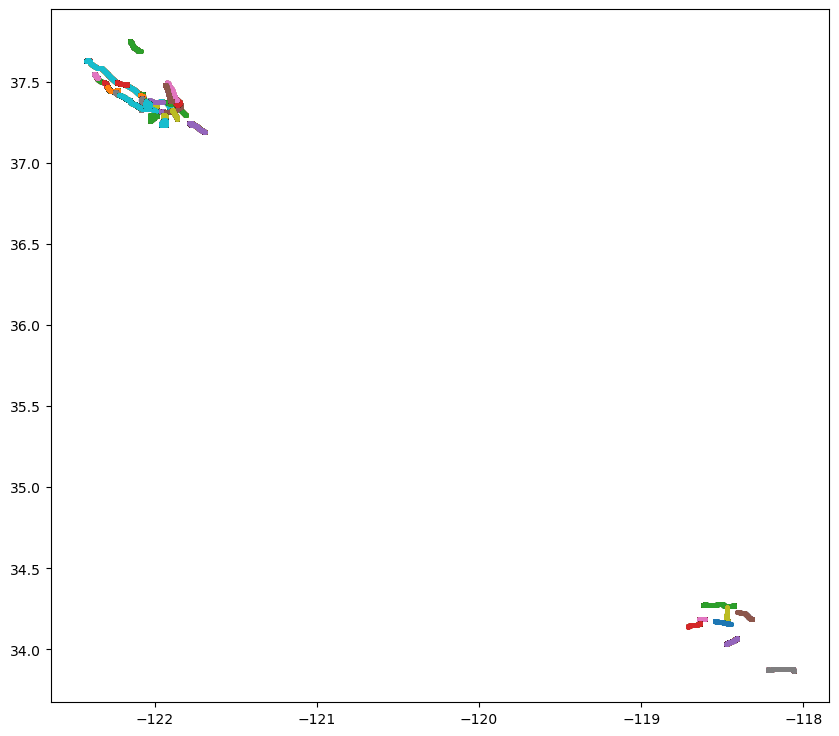

In [5]:
def read_ground_truth_files(root_folder):
    ground_truth_files = []
    # read all ground_truth.csv files
    for root, dirs, files in os.walk(root_folder):
        for file in files:
            if file == 'ground_truth.csv':
                file_path = os.path.join(root, file)
                df = pd.read_csv(file_path)
                ground_truth_files.append(df)
    return ground_truth_files

root_folder = './smartphone-decimeter-2023/sdc2023/train/'
# read as list of dataframes
ground_truth_data = read_ground_truth_files(root_folder)

# convert to GeoDataFrames
gdfs = []
for file in ground_truth_data:
    gdf = GeoDataFrame(file, geometry=gpd.points_from_xy(file.LongitudeDegrees, file.LatitudeDegrees))
    gdfs.append(gdf)

# for gdf in gdfs:
#     print(gdf.head())

fig, ax = plt.subplots(figsize=(16, 9))
for gdf in gdfs:
    gdf.plot(ax=ax, markersize=5, alpha=0.5)

In [6]:
import pandas as pd
import plotly.express as px

for idx, df in enumerate(gdfs):
    df['index'] = idx

# combine all dataframes
combined_df = pd.concat(gdfs, ignore_index=True)

# 绘制地图
fig = px.scatter_mapbox(combined_df,
                        lat="LatitudeDegrees",
                        lon="LongitudeDegrees",
                        color='index',  # use index as color
                        zoom=9,
                        center={"lat":37.423576, "lon":-122.094132},
                        height=600,
                        width=800,
                        color_continuous_scale='Viridis') # color scheme

fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.update_layout(title_text="GPS traffic")
fig.show()

